In [1]:
## We'll import these, but I don't know how much 
## we'll use them

## For data handling
import pandas as pd
import numpy as np

## For plotting
import matplotlib.pyplot as plt
from seaborn import set_style
import seaborn as sns
## This sets the plot style
## to have a grid on a white background
set_style("white")

#For machine learning methods
from sklearn.model_selection import train_test_split

#For neural network
from tensorflow import keras 
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img

## Importing the things
from keras import models
from keras import layers
from keras import optimizers
from keras import losses
from keras import metrics
from keras.utils import to_categorical
import json

import skimage
print(skimage.__version__)

import warnings
warnings.filterwarnings('ignore')

## Checks what is tensorflow running on
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

## This imports datasets stored in keras
from keras.datasets import mnist

0.19.2
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 11449508270179026579
xla_global_id: -1
]


In [2]:
birds_db = pd.read_csv('./birds_archive/birds.csv')
birds_db.value_counts('labels')
birds_class = pd.read_csv('./birds_archive/class_dict.csv')
birds_names = pd.read_csv('./birds_archive/birds latin names.csv')

print(birds_names.head(2))
print('..................................\n')
print(birds_class.head(2))
print('..................................\n')
(birds_db.tail())
#birds_db.loc[birds_db.labels=='ABBOTTS BABBLER']
#birds_db.value_counts('labels')


   class_index            class       SCIENTIFIC NAME
0            0  ABBOTTS BABBLER  Malacocincla abbotti
1            1    ABBOTTS BOOBY      Papasula abbotti
..................................

   class_index            class  height  width  scale by  Offset
0            0  ABBOTTS BABBLER     112    112         1       0
1            1    ABBOTTS BOOBY     112    112         1       0
..................................



,class index,filepaths,labels,data set
62383,399,valid/YELLOW HEADED BLACKBIRD/1.jpg,YELLOW HEADED BLACKBIRD,valid
62384,399,valid/YELLOW HEADED BLACKBIRD/2.jpg,YELLOW HEADED BLACKBIRD,valid
62385,399,valid/YELLOW HEADED BLACKBIRD/3.jpg,YELLOW HEADED BLACKBIRD,valid
62386,399,valid/YELLOW HEADED BLACKBIRD/4.jpg,YELLOW HEADED BLACKBIRD,valid
62387,399,valid/YELLOW HEADED BLACKBIRD/5.jpg,YELLOW HEADED BLACKBIRD,valid


In [18]:
df1 = birds_class.head(5)
print(df1.tail(2))
df2 = birds_names.head(5)
print(df2.tail(2))
pd.concat([df1, df2], join='outer').drop(columns=['scale by']).head(2)


new_arr = np.zeros(1)
new_arr = np.delete(new_arr, 0)
new_arr = np.append(new_arr, [0,-2,0,3,2,5,8,-2,5,0,0,0,19])
print(new_arr)
np.unique(new_arr)

   class_index                   class  height  width  scale by  Offset
3            3   AFRICAN CROWNED CRANE     112    112         1       0
4            4  AFRICAN EMERALD CUCKOO     112    112         1       0
   class_index                   class       SCIENTIFIC NAME
3            3   AFRICAN CROWNED CRANE   Balearica regulorum
4            4  AFRICAN EMERALD CUCKOO  Chrysococcyx cupreus


,class_index,class,height,width,Offset,SCIENTIFIC NAME
0,0,ABBOTTS BABBLER,112.0,112.0,0.0,NaN
1,1,ABBOTTS BOOBY,112.0,112.0,0.0,NaN


In [6]:
%%time 
# this piece loads image data into a list and a numpy array 
bird_labels = []
bird_label_num = []
birdImage_list_jpg = []
birdImage_list = []

for indx, filepath, label in zip(range(len(birds_db)), birds_db.filepaths, birds_db.labels):
    if indx > 10000:
        break
    else:
        try:
            bird_labels.append(label)
            bird_label_num.append(birds_names.loc[birds_names['class'] == label, :].values[0])
            #print(filepath)
            img = tf.keras.utils.load_img(
                './birds_archive/Data/'+filepath,
                grayscale=False,
                color_mode='rgb',
                target_size=None,
                interpolation='nearest',
                keep_aspect_ratio=False)
        
            # list of bird images in jpg format 
            birdImage_list_jpg.append(img)  
        
            img_arr = np.array(img)
            # List containng all bird images each in array format 
            birdImage_list.append(img_arr)
        except (TypeError, IndexError) as e:
            pass
        #print(indx, label)

# Numpy array N x 224x224x3 containing all bird images 
birdImage_arr = np.array(birdImage_list) 

CPU times: total: 15.2 s
Wall time: 45.4 s


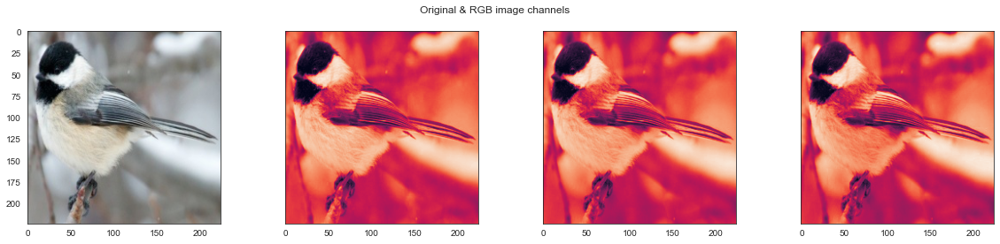

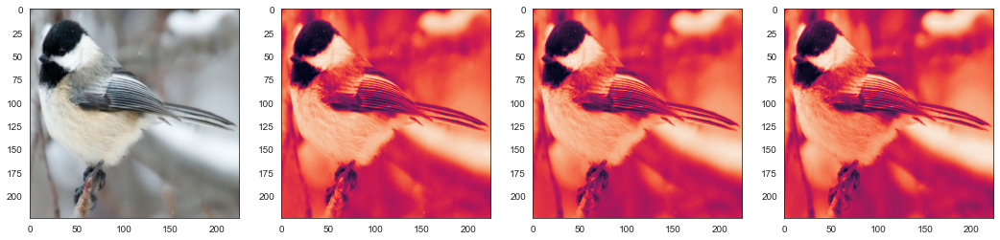

In [47]:
img = tf.keras.utils.load_img(
                './birds_archive/Data/'+filepath,
                grayscale=False,
                color_mode='rgb',
                target_size=None,
                interpolation='nearest',
                keep_aspect_ratio=False)


i, (im1, im2, im3, im4) = plt.subplots(1, 4, sharey=True)
i.set_figwidth(20) 
im1.imshow(img)  #Original image
im2.imshow(np.array(img)[:, : , 0]) #Red
im3.imshow(np.array(img)[:, : , 1]) #Green
im4.imshow(np.array(img)[:, : , 2]) #Blue
i.suptitle('Original & RGB image channels')

fig,ax = plt.subplots(1,4,figsize=(18,18))
ax[0].imshow(np.array(img)[:, : , :])
ax[1].imshow(np.array(img)[:, : , 0])
ax[2].imshow(np.array(img)[:, : , 1])
ax[3].imshow(np.array(img)[:, : , 2])
plt.show()
plt.close()

In [23]:
X_train, X_val, y_train, y_val = train_test_split(birdImage_arr, (pd.DataFrame(bird_label_num)[0]).values,
                                                                          test_size=0.2, shuffle=True, random_state=44)

X_train = X_train / 255
X_val = X_val / 255
print(X_train.shape)

#X_train = X_train.reshape()

(7887, 224, 224, 3)


     class_index               labels         SCIENTIFIC NAME
209          209      HARLEQUIN QUAIL    Coturnix delegorguei
280          280    NORTHERN SHOVELER        Spatula clypeata
33            33             AVADAVAT       Amandava amandava
210          210          HARPY EAGLE          Harpia harpyja
93            93        CAPE LONGCLAW       Macronyx capensis
..           ...                  ...                     ...
314          314    RED FACED WARBLER   Cardellina rubrifrons
373          373    TROPICAL KINGBIRD  Tyrannus melancholicus
380          380  VERMILION FLYCATHER   Pyrocephalus obscurus
239          239           JACK SNIPE    Lymnocryptes minimus
75            75           BLUE HERON          Ardea herodias

[100 rows x 3 columns]


,index,class index,filepaths,labels,data set
0,0,0,train/ABBOTTS BABBLER/001.jpg,ABBOTTS BABBLER,train
1,1,0,train/ABBOTTS BABBLER/002.jpg,ABBOTTS BABBLER,train
2,2,0,train/ABBOTTS BABBLER/003.jpg,ABBOTTS BABBLER,train
3,3,0,train/ABBOTTS BABBLER/004.jpg,ABBOTTS BABBLER,train
4,4,0,train/ABBOTTS BABBLER/005.jpg,ABBOTTS BABBLER,train
...,...,...,...,...,...
15689,62368,396,valid/WOOD DUCK/1.jpg,WOOD DUCK,valid
15690,62369,396,valid/WOOD DUCK/2.jpg,WOOD DUCK,valid
15691,62370,396,valid/WOOD DUCK/3.jpg,WOOD DUCK,valid
15692,62371,396,valid/WOOD DUCK/4.jpg,WOOD DUCK,valid


In [91]:
print(np.unique(birds_db_subset['class index']))
np.unique(birds_db_subset['labels'])
birds_db.labels

[  0   3   5   9  15  18  22  25  30  31  33  39  42  45  46  55  56  57
  63  70  72  73  75  76  77  78  82  84  90  93  94 101 104 108 113 114
 116 118 124 126 132 140 141 148 152 158 172 173 176 180 181 193 202 209
 210 220 223 225 227 231 232 233 239 246 248 250 255 261 262 266 268 271
 274 278 280 289 294 301 314 320 321 329 335 338 342 352 361 369 373 374
 376 380 381 382 385 388 391 394 395 396]


0                ABBOTTS BABBLER
1                ABBOTTS BABBLER
2                ABBOTTS BABBLER
3                ABBOTTS BABBLER
4                ABBOTTS BABBLER
                  ...           
62383    YELLOW HEADED BLACKBIRD
62384    YELLOW HEADED BLACKBIRD
62385    YELLOW HEADED BLACKBIRD
62386    YELLOW HEADED BLACKBIRD
62387    YELLOW HEADED BLACKBIRD
Name: labels, Length: 62388, dtype: object

# New training data: 100 species and all corresponding images 

- Here I have a new dataset for training. In this case, I have selected 100 randomly chosen bird species out of 400 in total. The selected labels are used for running a query in the original $\rm{birds_{db}}$ database to collect all images and data points correspoinding to these 100 labels, in total $15694$ data points or observations. Since these labels were randomly selected the numerical indices are not orderly unlike the entire dataset. This causes a problem with the output neron layer in the Conv Net architecture, with many of the images having unclassified labels. So I have assigned new numerical labels $0 - 99$ to each image. This way we can use tensorflow method to_categorical to convert the digits to $[1,0,0,..0]$ format compatible with softmax probability output.    

In [3]:
birds_names_subset = birds_names.sample(100, random_state=42)
birds_names_subset = birds_names_subset.rename(columns={'class':'labels'})
print(birds_names_subset)

birds_db_subset = birds_db[birds_db['labels'].isin(birds_names_subset['labels'])].dropna()
birds_db_subset = birds_db_subset.reset_index()
birds_db_subset

#pd.DataFrame(pd.Series(label_dict, index=label_dict.keys()))
label_dict = {i:birds_names_subset['labels'].values[i] for i in range(len(birds_names_subset))}
labelsDF = pd.DataFrame(label_dict.items(), columns=['label_index','label'])


     class_index               labels         SCIENTIFIC NAME
209          209      HARLEQUIN QUAIL    Coturnix delegorguei
280          280    NORTHERN SHOVELER        Spatula clypeata
33            33             AVADAVAT       Amandava amandava
210          210          HARPY EAGLE          Harpia harpyja
93            93        CAPE LONGCLAW       Macronyx capensis
..           ...                  ...                     ...
314          314    RED FACED WARBLER   Cardellina rubrifrons
373          373    TROPICAL KINGBIRD  Tyrannus melancholicus
380          380  VERMILION FLYCATHER   Pyrocephalus obscurus
239          239           JACK SNIPE    Lymnocryptes minimus
75            75           BLUE HERON          Ardea herodias

[100 rows x 3 columns]


In [4]:
%%time 
# this piece loads image data into a list and a numpy array 
bird_labels = []
bird_label_num = []
birdImage_list_jpg = []
birdImage_list = []

for indx, filepath, label in zip(range(len(birds_db_subset)), birds_db_subset.filepaths, birds_db_subset.labels):
    try:
        bird_labels.append(label)
        bird_label_num.append(labelsDF.loc[labelsDF['label'] == label, 'label_index'].values[0])
        #print(filepath)
        img = tf.keras.utils.load_img(
                './birds_archive/Data/'+filepath,
                grayscale=False,
                color_mode='rgb',
                target_size=None,
                interpolation='nearest',
                keep_aspect_ratio=False)
        
        # list of bird images in jpg format 
        birdImage_list_jpg.append(img)  
        
        img_arr = np.array(img)
        # List containng all bird images each in array format 
        birdImage_list.append(img_arr)
    except (TypeError, IndexError) as e:
        pass
        #print(indx, label)

# Numpy array N x 224x224x3 containing all bird images 
birdImage_arr = np.array(birdImage_list) 

X_train, X_val, y_train, y_val = train_test_split(birdImage_arr, (pd.DataFrame(bird_label_num)[0]).values,
                                                                          test_size=0.15, shuffle=True, random_state=44)
X_train = X_train / 255
X_val = X_val / 255
print(X_train.shape)
print()
print(X_val.shape)

(13339, 224, 224, 3)

(2355, 224, 224, 3)
CPU times: total: 26 s
Wall time: 1min 10s


# Train images with feed-forward Neural Network 

In [232]:
from sklearn.decomposition import PCA 
from sklearn.preprocessing import StandardScaler
# create a pca object with explained_variance_ratio = 0.95
pca = PCA(n_components=0.99)

pipe_pca = ([('scale', StandardScaler()),('pca', PCA(n_components=0.95))])

X_train = X_train.reshape(-1,224*224*3)
X_val = X_val.reshape(-1,224*224*3)
X_train.shape

pca.fit(X_train)
X_train_pca = pca.transform(X_train)
X_val_pca = pca.transform(X_val)
#pipe_pca['pca'].explained_variance_ratio

#print(svc_pipe['pca'].explained_variance_ratio_.shape)
#print(svc_pipe['pca'].explained_variance_ratio_.sum())
#svc_pipe['pca'].explained_variance_ratio_

In [ ]:
%%time

model = models.Sequential()
model.add(layers.Dense(500, activation='relu', input_shape=(663,)))
model.add(layers.Dense(500, activation='relu'))
model.add(layers.Dense(400, activation='softmax'))

print(model.summary())

#Compile model
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

## First make the validation set

# ## Fit the model, and store the training history
## using 100 epochs and a batch_size of 512

history = model.fit(X_train_pca, to_categorical(y_train), epochs=5, batch_size=100,
                   validation_data=(X_val_pca, to_categorical(y_val)))

history_dict = history.history
print(history_dict.keys())

In [7]:
X_train.shape, to_categorical(y_train).shape, X_val.shape, to_categorical(y_val).shape, n_species

((13339, 224, 224, 3), (13339, 100), (2355, 224, 224, 3), (2355, 100), 100)

# Train images with Convolutional Neural Network: architecture 1

In [6]:
model = models.Sequential()
n_species = to_categorical(y_train).shape[1]
# Add convolutional layer
#model.add( layers.Conv3D(32, (3,3,3), activation='relu', input_shape=(224,224,3,1)) )
model.add( tf.keras.layers.Conv2D(32, 3, activation='relu', input_shape=(224,224, 3)))

model.add( layers.MaxPool2D((2,2), strides=2) ) 

# more layers 
model.add( layers.Conv2D(32, (3,3), activation='relu') )
model.add( layers.MaxPool2D((2,2), strides=2))
model.add( layers.Conv2D(32, (3,3), activation='relu') )

model.add( layers.MaxPool2D((2,2), strides=2))
model.add( layers.Conv2D(64, (3,3), activation='relu')) 


# Now we'll add the fully connected layer >>> feedforward

## .Flatten() will flatten the data for us
model.add(layers.Flatten())
model.add(layers.Dropout(.5))
## Then we add a single dense hidden layer
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(64, activation='relu'))
## Finally an output layer
model.add(layers.Dense(n_species, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 32)       0

In [39]:
from keras.models import load_model

model = load_model('cnn_birds_new.h5')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 32)        9248      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 32)       0

In [34]:
%%time
# Compile the model 

model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])
callback = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=5,  restore_best_weights=True)
## First make the validation set

# ## Fit the model, and store the training history
## using 100 epochs and a batch_size of 512
n_epoch= 5
history = model.fit(X_train, to_categorical(y_train), epochs=n_epoch, batch_size=64,
                   validation_data=(X_val, to_categorical(y_val)), callbacks=[callback], verbose=1)

history_dict = history.history
print(history_dict.keys())

Epoch 1/5
209/209 [==============================] - 179s 852ms/step - loss: 0.1200 - accuracy: 0.9672 - val_loss: 4.8171 - val_accuracy: 0.5771
Epoch 2/5
209/209 [==============================] - 178s 850ms/step - loss: 0.0980 - accuracy: 0.9741 - val_loss: 6.4445 - val_accuracy: 0.5180
Epoch 3/5
209/209 [==============================] - 179s 854ms/step - loss: 0.1060 - accuracy: 0.9718 - val_loss: 4.6879 - val_accuracy: 0.5762
Epoch 4/5
209/209 [==============================] - 179s 856ms/step - loss: 0.1078 - accuracy: 0.9705 - val_loss: 4.5888 - val_accuracy: 0.5809
Epoch 5/5
209/209 [==============================] - 179s 858ms/step - loss: 0.1001 - accuracy: 0.9717 - val_loss: 4.6277 - val_accuracy: 0.5919
dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])
CPU times: total: 1h 59min 45s
Wall time: 14min 58s


In [37]:
model.save("cnn_birds_new.h5")
print("Saved model to disk")

Saved model to disk


In [14]:
# run ONLY once
val_accuracy = []
train_accuracy = []

# New training sample of size 15,000 and 100 labels


In [41]:
for tr, val, loss in zip(history_dict['accuracy'], history_dict['val_accuracy'], history_dict['val_loss']): 
    train_accuracy.append(tr)
    val_accuracy.append(val)
    
with open("train_accuracy", "w") as fp:
    json.dump(train_accuracy, fp)

with open("validation_accuracy", "w") as fp:
    json.dump(val_accuracy, fp)

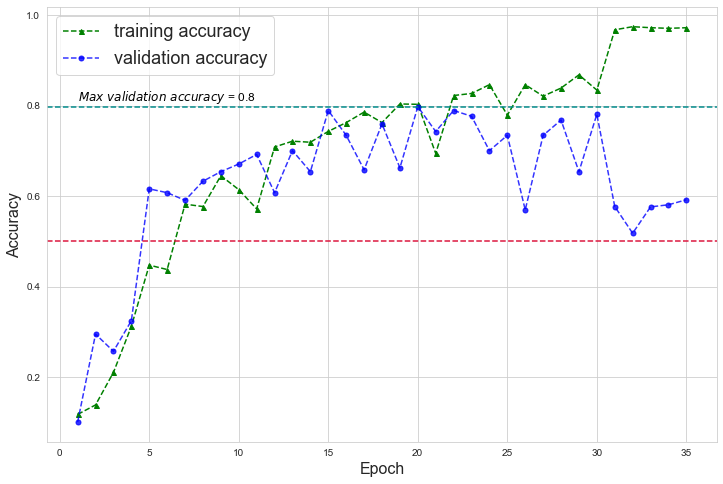

74/74 [==============================] - 7s 94ms/step


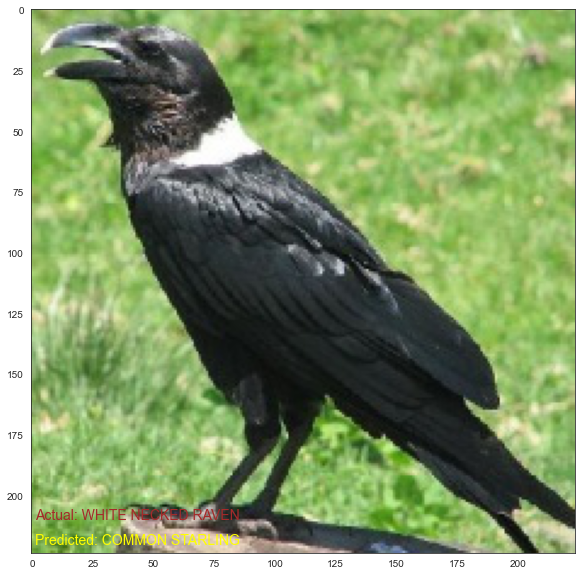

In [42]:
with open("train_accuracy", "r") as fp:
    train_accuracy = json.load(fp)   
with open("validation_accuracy", "r") as fp:
    val_accuracy = json.load(fp)
    
N = len(val_accuracy) #n_epoch-1
# Display the metrics
set_style("whitegrid")
plt.figure(figsize=(12,8))
plt.plot(range(1,N+1), train_accuracy,'g--^', markersize=5,label='training accuracy')
plt.plot(range(1,N+1), val_accuracy,'b--o', markersize=5, alpha=0.8, label='validation accuracy')
plt.xlabel('Epoch', fontsize=16)
plt.ylabel('Accuracy', fontsize=16)

plt.axhline(y=0.5, color='crimson', ls='--', alpha=1)
plt.axhline(y=np.array(val_accuracy).max(), color='darkcyan', ls='--')

plt.text(1,np.round(np.array(val_accuracy).max(),2)+0.01, 
         '$Max ~validation ~ accuracy$ = ' +str(np.round(np.array(val_accuracy).max(),2)), 
         color='k', fontsize=12 )

#plt.savefig('perfomance_cnn_new.pdf')
plt.legend(fontsize=18)
plt.show()
plt.close()

set_style("white")
# Prediction power
n=np.random.binomial(100,0.5,1)[0]
predicted_bird = model.predict(X_val)[n].argmax()
actual_bird = y_val[n]

plt.figure(figsize=(10,10))
plt.imshow(X_val[n], cmap='gray')
plt.text(1,220, 'Predicted: ' + str(labelsDF.loc[labelsDF['label_index'] == predicted_bird, 'label'].values[0]),
         color='yellow', fontsize=14 )

plt.text(1,210, 'Actual: ' + str(labelsDF.loc[labelsDF['label_index'] == actual_bird, 'label'].values[0]),
         color='brown', fontsize=14 )


plt.show()
plt.close()

74/74 [==============================] - 7s 96ms/step


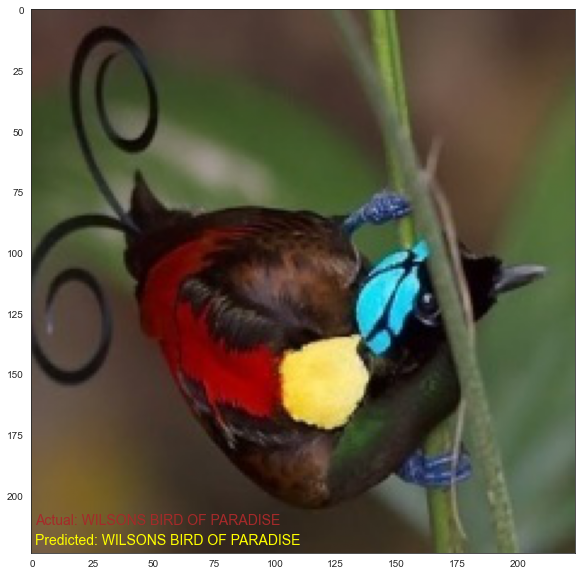

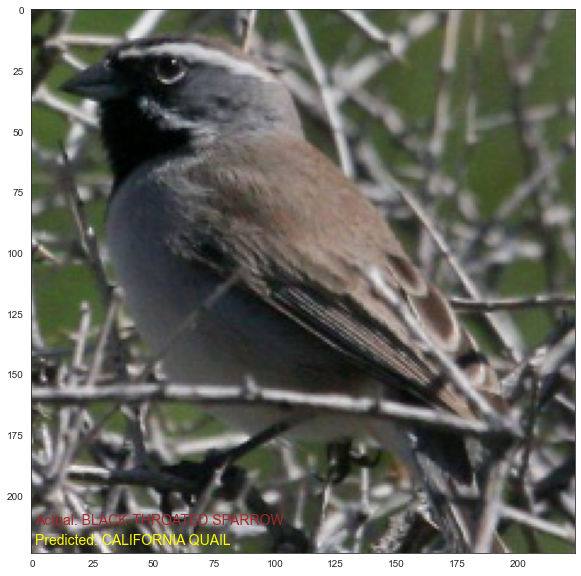

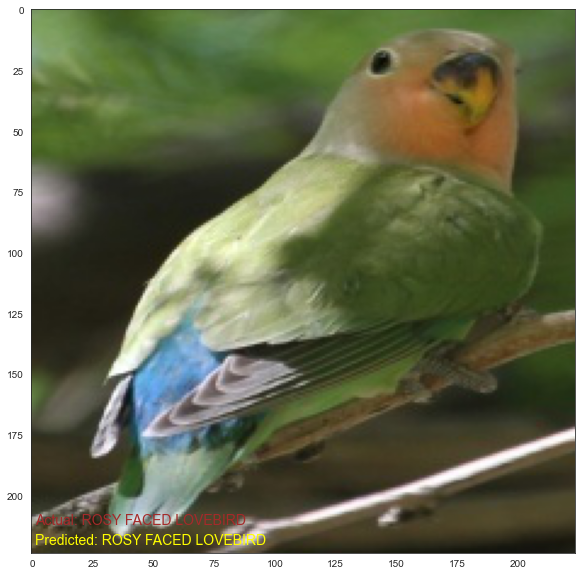

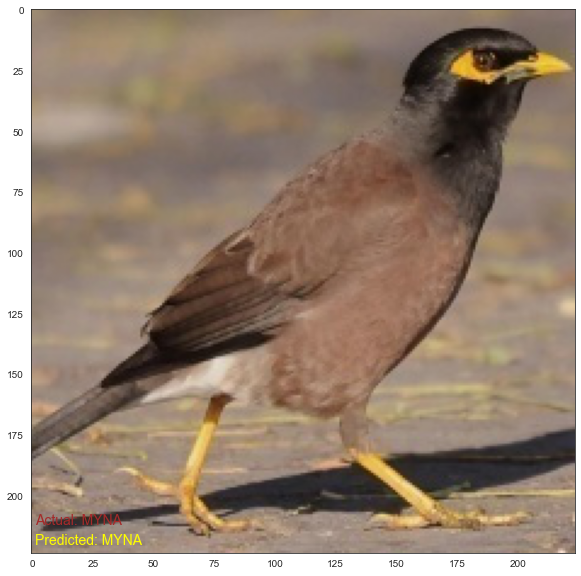

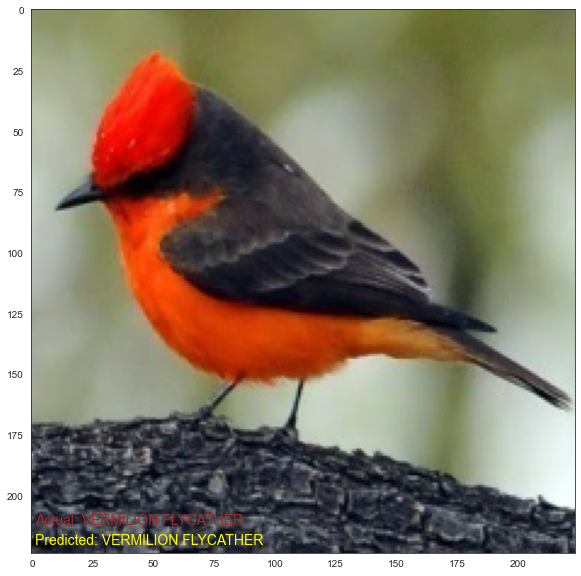

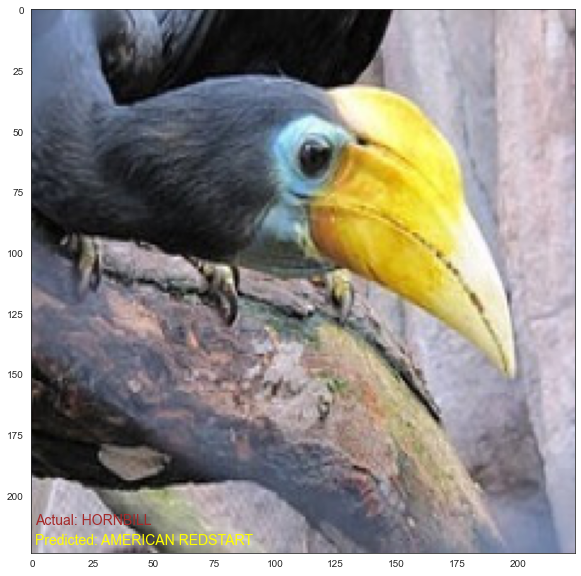

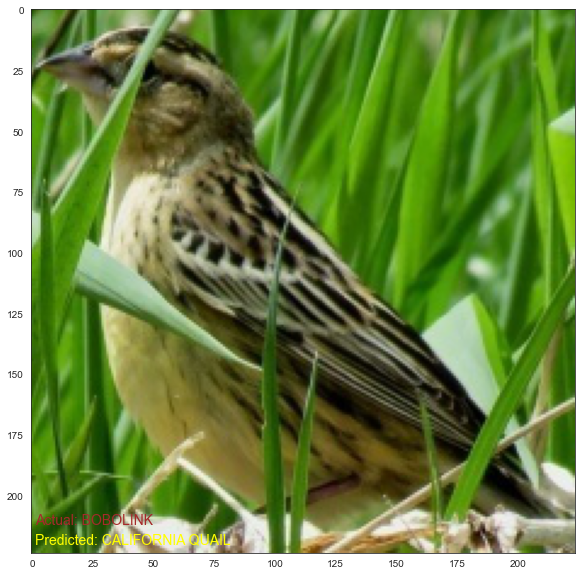

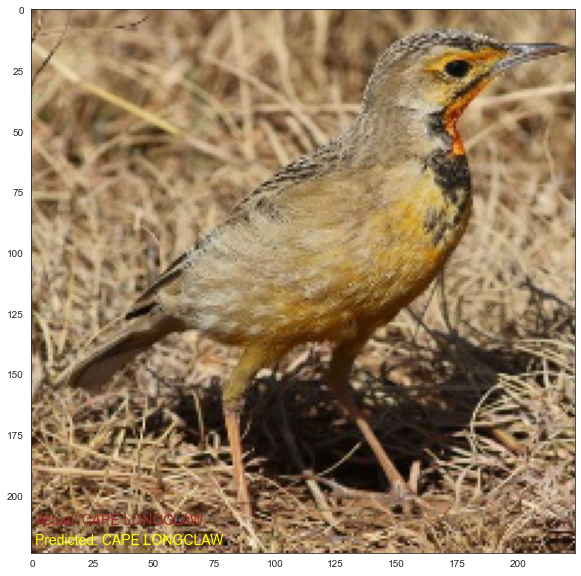

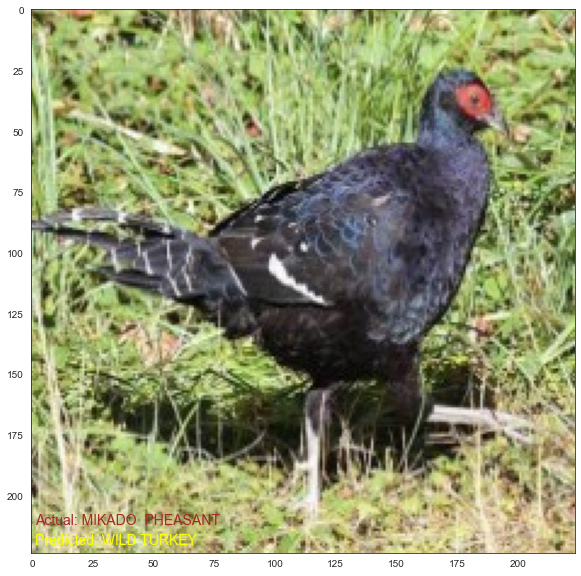

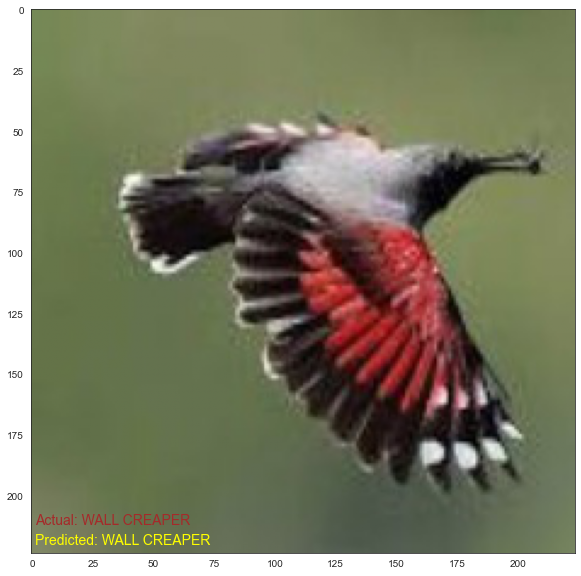

sample accuracy = 6 out of 10


In [26]:
set_style("white")

predicted_array = model.predict(X_val)
def imageArray_predict(model, i, y):
    predicted_bird = predicted_array[i].argmax()
    actual_bird = y
   
    plt.figure(figsize=(10,10))
    plt.imshow(x, cmap='gray')



    plt.text(1,220, 'Predicted: ' + str(labelsDF.loc[labelsDF['label_index'] == predicted_bird, 'label'].values[0]),
         color='yellow', fontsize=14 )

    plt.text(1,212, 'Actual: ' + str(labelsDF.loc[labelsDF['label_index'] == actual_bird, 'label'].values[0]),
         color='brown', fontsize=14 )
    plt.show()
    plt.close()
    

def pred_acc(model, i, y):
        predicted_bird = predicted_array[i].argmax()
        actual_bird = y
        return (predicted_bird == actual_bird)*1

# check for the first n images in the validation set 
# note: zip is a useful function for iterating in parallel 
n1 = 0#np.random.binomial(X_val.shape[0], 0.5, 1)[0]
n2= 10#n1 + np.random.binomial(10, 0.5, 1)[0]
i=0
accuracy=0
for x, y in zip(X_val[n1:n2], y_val[n1:n2]):
    imageArray_predict(model, i, y)  # <<<<<<<<<<<<< show images 
    accuracy += pred_acc(model, i, y)
    i += 1
print("sample accuracy =", accuracy, 'out of', (n2-n1))

# The code below is good for the trainig sample with 70 species and 10,000 data points 

In [42]:
# run ONLY once
val_acc = []
train_acc = []
val_loss = []

In [147]:
for tr, val, loss in zip(history_dict['accuracy'], history_dict['val_accuracy'], history_dict['val_loss']): 
    train_acc.append(tr)
    val_acc.append(val)
    val_loss.append(loss)
    
    
    
with open("train_accuracy", "w") as fp:
    json.dump(train_acc, fp)

with open("validation_accuracy", "w") as fp:
    json.dump(val_acc, fp)

with open("validation_loss", "w") as fp:
    json.dump(val_loss, fp)

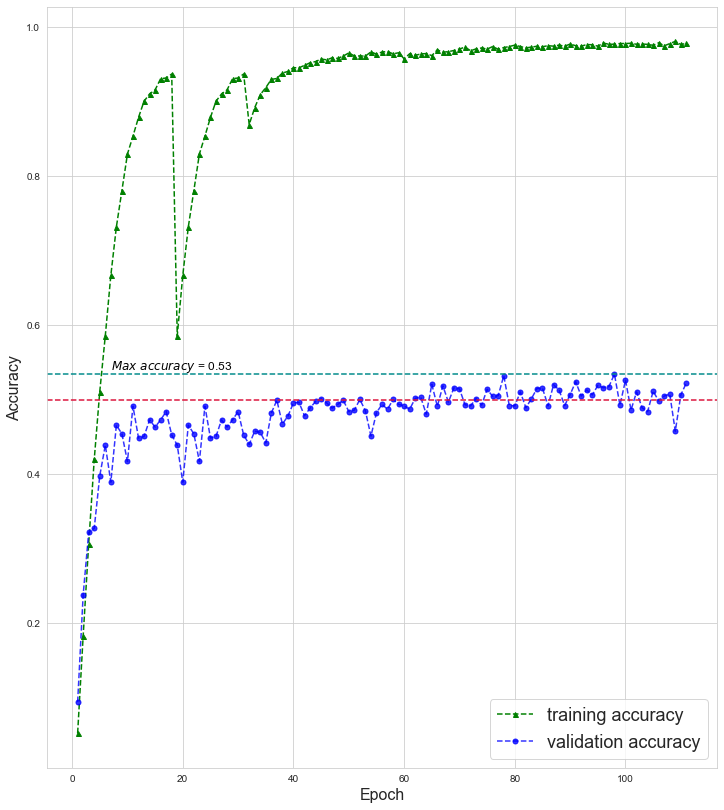

62/62 [==============================] - 5s 83ms/step


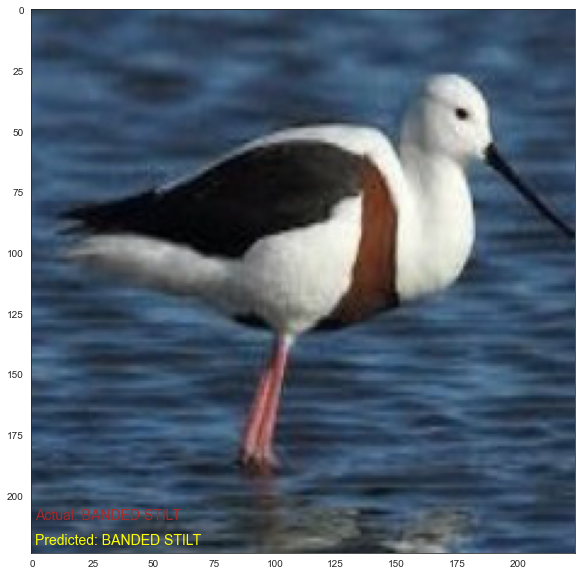

In [154]:
with open("train_accuracy", "r") as fp:
    train_acc = json.load(fp)   
with open("validation_accuracy", "r") as fp:
    val_acc = json.load(fp)
with open("validation_loss", "r") as fp:
    val_loss = json.load(fp)
    
N = len(val_acc) #n_epoch-1
# Display the metrics
set_style("whitegrid")
plt.figure(figsize=(12,14))
plt.plot(range(1,N+1), train_acc,'g--^', markersize=5,label='training accuracy')
#plt.plot(range(1,N+1), val_loss,'g--o', markersize=5,label='validation loss')
plt.plot(range(1,N+1), val_acc,'b--o', markersize=5, alpha=0.8, label='validation accuracy')
plt.xlabel('Epoch', fontsize=16)
plt.ylabel('Accuracy', fontsize=16)

plt.axhline(y=0.5, color='crimson', ls='--', alpha=1)
plt.axhline(y=np.array(val_acc).max(), color='darkcyan', ls='--')

plt.text(7,np.round(np.array(val_acc).max(),2)+0.01, '$Max ~ accuracy$ = ' +str(np.round(np.array(val_acc).max(),2)), 
         color='k', fontsize=12 )

plt.savefig('perfomance_cnn1.pdf')
plt.legend(fontsize=18)
plt.show()
plt.close()

set_style("white")
# Prediction power
n=np.random.binomial(100,0.5,1)[0]
predicted_bird = model.predict(X_val)[n].argmax()
actual_bird = y_val[n]

plt.figure(figsize=(10,10))
plt.imshow(X_val[n], cmap='gray')
plt.text(1,220, 'Predicted: ' + str(birds_names.loc[birds_names['class_index'] == predicted_bird, 'class'].values[0]),
         color='yellow', fontsize=14 )

plt.text(1,210, 'Actual: ' + str(birds_names.loc[birds_names['class_index'] == actual_bird, 'class'].values[0]),
         color='brown', fontsize=14 )


plt.show()
plt.close()

In [138]:
y_val.shape

(1972,)

62/62 [==============================] - 5s 83ms/step


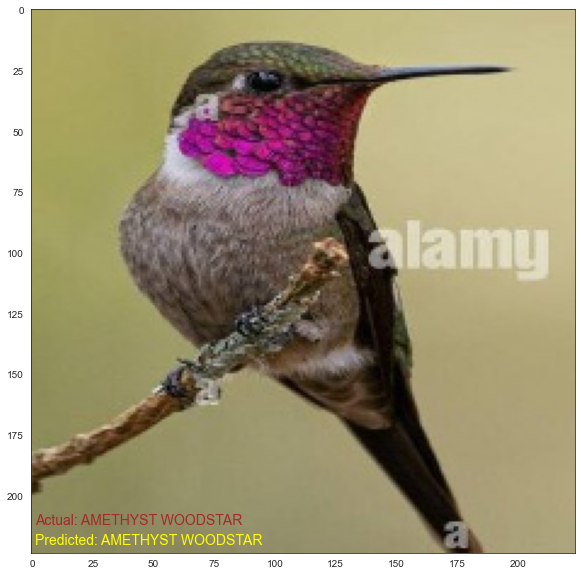

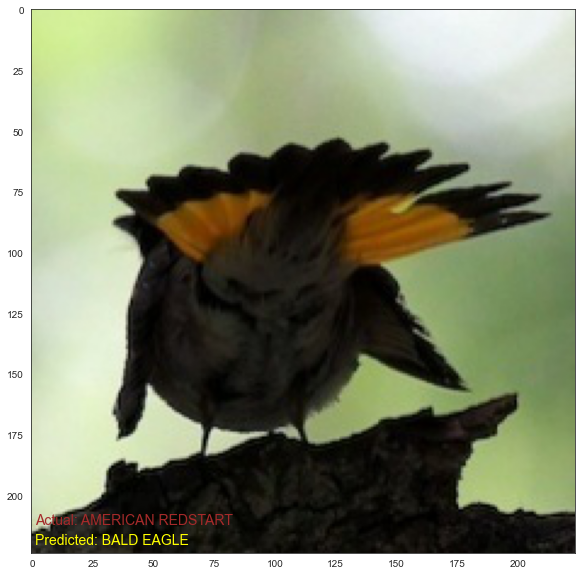

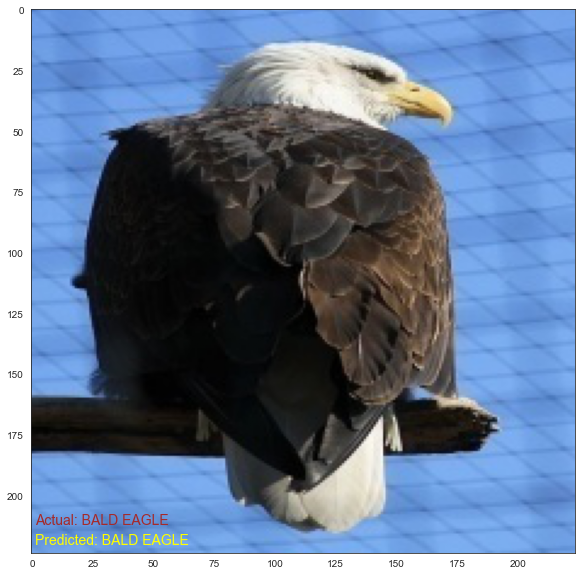

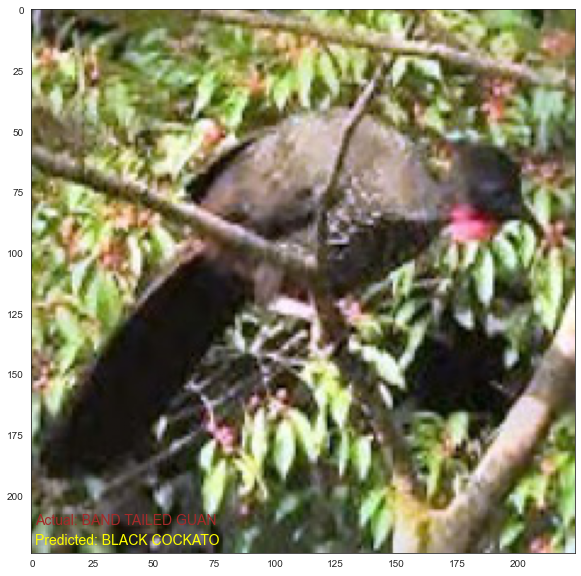

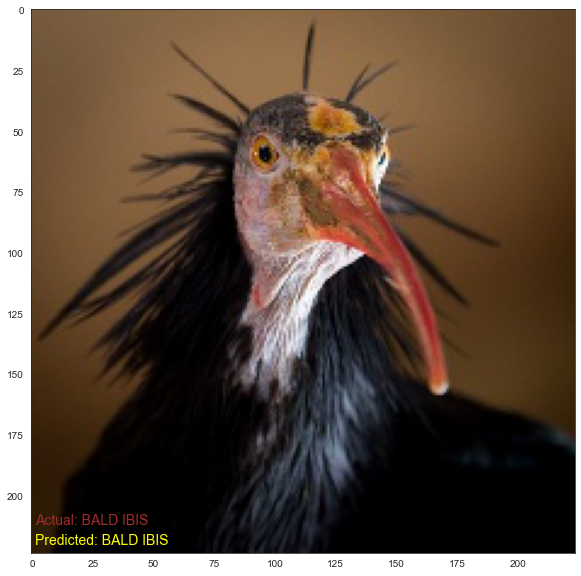

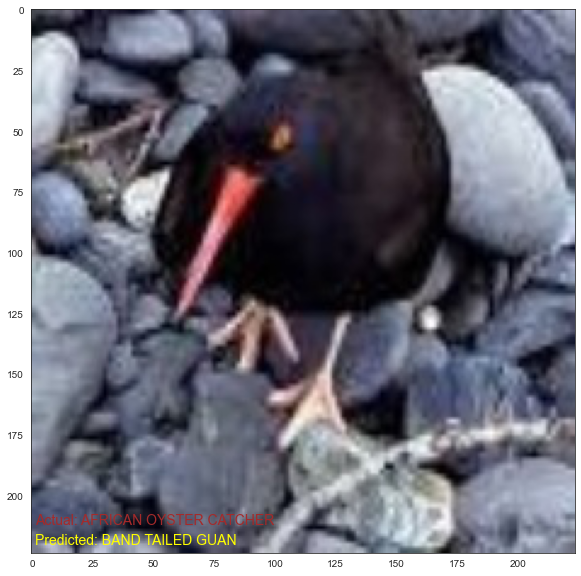

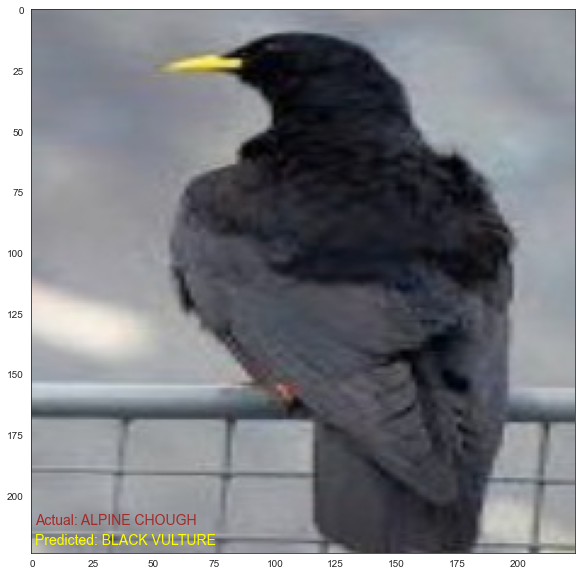

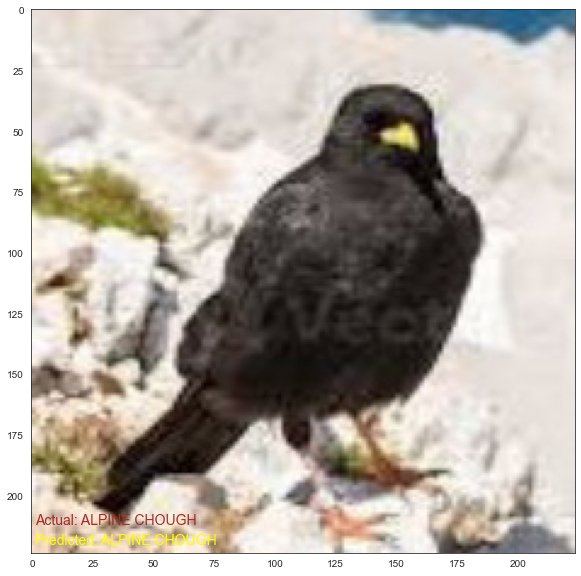

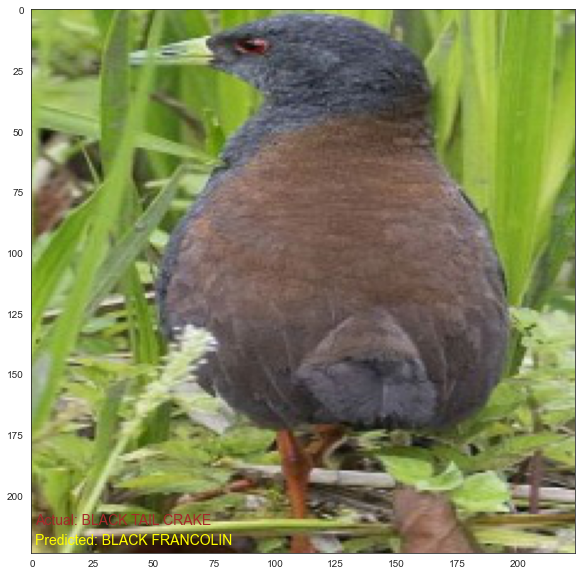

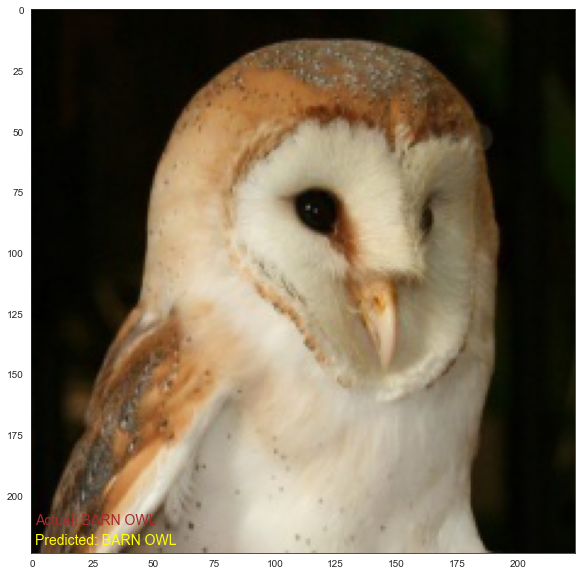

sample accuracy = 5 out of 10


In [151]:
set_style("white")

predicted_array = model.predict(X_val)
def imageArray_predict(model, i, y):
    predicted_bird = predicted_array[i].argmax()
    actual_bird = y
   
    plt.figure(figsize=(10,10))
    plt.imshow(x, cmap='gray')



    plt.text(1,220, 'Predicted: ' + str(birds_names.loc[birds_names['class_index'] == predicted_bird, 'class'].values[0]),
         color='yellow', fontsize=14 )

    plt.text(1,212, 'Actual: ' + str(birds_names.loc[birds_names['class_index'] == actual_bird, 'class'].values[0]),
         color='brown', fontsize=14 )
    plt.show()
    plt.close()
    

def pred_acc(model, i, y):
        predicted_bird = predicted_array[i].argmax()
        actual_bird = y
        return (predicted_bird == actual_bird)*1

# check for the first n images in the validation set 
# note: zip is a useful function for iterating in parallel 
n1 = 0#np.random.binomial(X_val.shape[0], 0.5, 1)[0]
n2= 10#n1 + np.random.binomial(10, 0.5, 1)[0]
i=0
accuracy=0
for x, y in zip(X_val[n1:n2], y_val[n1:n2]):
    imageArray_predict(model, i, y)  # <<<<<<<<<<<<< show images 
    accuracy += pred_acc(model, i, y)
    i += 1
print("sample accuracy =", accuracy, 'out of', (n2-n1))

# Use of Neural Networks for image classification 

(60000, 28, 28) (10000, 28, 28)


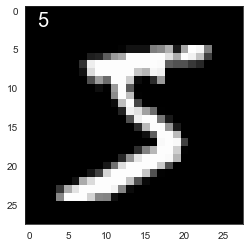

In [111]:
# test model with MNIST digits data
(X_train, y_train),(X_test, y_test) = mnist.load_data()

print(X_train.shape, X_test.shape)
plt.imshow(X_train[0,:,:], cmap='gray')
plt.text(1,2,y_train[0], fontsize=20, color='white')
plt.show()
plt.close()

#### SIDENOTE : CLASS BUILDING ##############
class Flatten:
    size=0
    def __init__(self):
        pass
        
    def result(self, x):
        x_copy = x.copy()
        return x.reshape(-1,28*28)


class Scale:
    def __init__(self):
        pass        
    
    def fit(self, x, y=None):
        copy_x = x.copy()
        result = copy_x / 1
        
    def transform(self, x, y=None):
        x_copy = x.copy()
        return x_copy / 255

class Flatten:
    size=0
    def __init__(self):
        pass
        
    def fit(self,x, y=None):
        x_copy = x.copy()
           
        
    def transform(self, x, y=None):
        x_copy = x.copy()
        return x_copy.reshape(-1,28*28)
    
    
from sklearn.pipeline import Pipeline        
pipe = Pipeline([('scale', Scale()), ('flatten', Flatten()) ])
pipe.transform(X_train)

# First we use a feed-forward multi-layer NN

In [115]:
### Scaling the input data
## We'll now scale X_train and X_test to be between 0 and 1
## instead of 0 and 255
X_train = X_train/255
X_test = X_test/255

X_train = X_train.reshape(-1,28*28)
X_test = X_test.reshape(-1,28*28)

print("The new shape of X_train is", np.shape(X_train))
print("The new shape of X_test is", np.shape(X_test))

# Make an empty model 
model = models.Sequential()

###### ONLY RUN THIS ONCE! ##########
model.add(layers.Dense(16, activation='relu', input_shape=(28*28,)))
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))


The new shape of X_train is (60000, 784)
The new shape of X_test is (10000, 784)


In [116]:
print(model.summary())

#Compile model
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 16)                12560     
                                                                 
 dense_10 (Dense)            (None, 16)                272       
                                                                 
 dense_11 (Dense)            (None, 10)                170       
                                                                 
Total params: 13,002
Trainable params: 13,002
Non-trainable params: 0
_________________________________________________________________
None


In [28]:
%%time
## First make the validation set
X_train_train, X_train_val, y_train_train, y_train_val = train_test_split(X_train, y_train, shuffle=True, 
                                                                          test_size=0.2, stratify=y_train, random_state=440)

# ## Fit the model, and store the training history
## using 100 epochs and a batch_size of 512

history = model.fit(X_train_train, to_categorical(y_train_train), epochs=100, batch_size=512,
                   validation_data=(X_train_val, to_categorical(y_train_val)))

history_dict = history.history
print(history_dict.keys())

Epoch 1/100
94/94 [==============================] - 1s 4ms/step - loss: 2.3020 - accuracy: 0.1120 - val_loss: 2.3015 - val_accuracy: 0.1123
Epoch 2/100
94/94 [==============================] - 0s 2ms/step - loss: 2.3014 - accuracy: 0.1124 - val_loss: 2.3012 - val_accuracy: 0.1123
Epoch 3/100
94/94 [==============================] - 0s 2ms/step - loss: 2.3013 - accuracy: 0.1124 - val_loss: 2.3012 - val_accuracy: 0.1123
Epoch 4/100
94/94 [==============================] - 0s 2ms/step - loss: 2.3012 - accuracy: 0.1124 - val_loss: 2.3012 - val_accuracy: 0.1123
Epoch 5/100
94/94 [==============================] - 0s 2ms/step - loss: 2.3012 - accuracy: 0.1124 - val_loss: 2.3012 - val_accuracy: 0.1123
Epoch 6/100
94/94 [==============================] - 0s 2ms/step - loss: 2.3012 - accuracy: 0.1124 - val_loss: 2.3012 - val_accuracy: 0.1123
Epoch 7/100
94/94 [==============================] - 0s 2ms/step - loss: 2.3012 - accuracy: 0.1124 - val_loss: 2.3012 - val_accuracy: 0.1123
Epoch 8/100
9

Epoch 59/100
94/94 [==============================] - 0s 2ms/step - loss: 2.2845 - accuracy: 0.1394 - val_loss: 2.2837 - val_accuracy: 0.1409
Epoch 60/100
94/94 [==============================] - 0s 2ms/step - loss: 2.2832 - accuracy: 0.1488 - val_loss: 2.2827 - val_accuracy: 0.1178
Epoch 61/100
94/94 [==============================] - 0s 2ms/step - loss: 2.2818 - accuracy: 0.1440 - val_loss: 2.2808 - val_accuracy: 0.1701
Epoch 62/100
94/94 [==============================] - 0s 2ms/step - loss: 2.2803 - accuracy: 0.1538 - val_loss: 2.2792 - val_accuracy: 0.1532
Epoch 63/100
94/94 [==============================] - 0s 2ms/step - loss: 2.2786 - accuracy: 0.1587 - val_loss: 2.2778 - val_accuracy: 0.1928
Epoch 64/100
94/94 [==============================] - 0s 2ms/step - loss: 2.2769 - accuracy: 0.1638 - val_loss: 2.2760 - val_accuracy: 0.1907
Epoch 65/100
94/94 [==============================] - 0s 2ms/step - loss: 2.2752 - accuracy: 0.1701 - val_loss: 2.2741 - val_accuracy: 0.1702
Epoch 

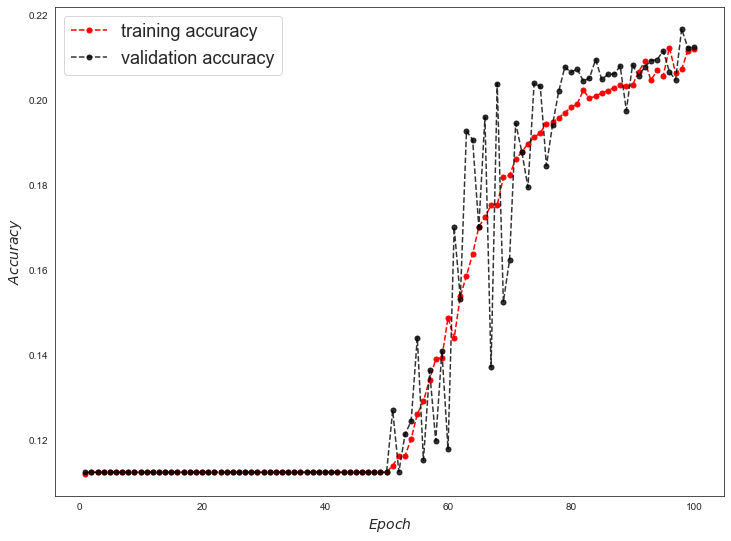

In [61]:
# Display the metrics

plt.figure(figsize=(12,9))
plt.plot(range(1,101), history_dict['accuracy'],'r--o', markersize=5,label='training accuracy')
#plt.plot(range(1,101), history_dict['loss'],'g--o', markersize=5,label='training loss')
plt.plot(range(1,101), history_dict['val_accuracy'],'k--o', markersize=5, alpha=0.8, label='validation accuracy')
plt.xlabel('$Epoch$', fontsize=14)
plt.ylabel('$Accuracy$', fontsize=14)
plt.legend(fontsize=18)
plt.show()
plt.close()

313/313 [==============================] - 0s 615us/step


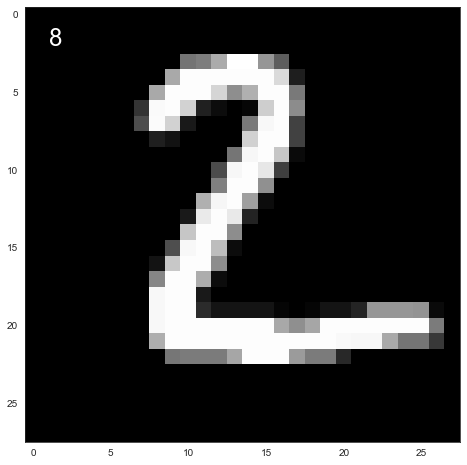

In [117]:
# Prediction power
(X_train, y_train),(X_test, y_test) = mnist.load_data()
n=1
plt.figure(figsize=(8,8))
plt.imshow(X_test[n], cmap='gray')
X_test = X_test.reshape(-1,28*28)
predicted_digit = np.argmax(model.predict(X_test)[n])
plt.text(1,2, predicted_digit, color='white', fontsize=24 )
plt.show()
plt.close()

## NEXT we use Convolutional Neural Network ###

In [118]:
# The inputs are 28x28 RGB images with `channels_last` and the batch
# size is 4.
input_shape = (4, 224, 224, 3)
x = tf.random.normal(input_shape)
y = tf.keras.layers.Conv2D(16, 3, activation='relu', input_shape=input_shape[1:])(x)
print(y.shape)
input_shape[1:]

(4, 222, 222, 16)


(224, 224, 3)

In [121]:
(X_train, y_train),(X_test, y_test) = mnist.load_data()
### Scaling the input data
## We'll now scale X_train and X_test to be between 0 and 1
## instead of 0 and 255
X_train = X_train/255
X_test = X_test/255

#X_train = X_train.reshape(-1,28*28)
#X_test = X_test.reshape(-1,28*28)

print("The new shape of X_train is", np.shape(X_train))
print("The new shape of X_test is", np.shape(X_test))

# Make model object
model = models.Sequential()

# Add convolutional layer
## Conv2D(32), specifies that we want a convolutional layer with depth 32
## (3,3) is our sliding grid size
## We're using the relu activation function
## and our images are a gray scale value for 28X28 pixels
model.add( layers.Conv2D(32, (3,3), activation='relu', input_shape=(28,28,1)) )
model.add( layers.MaxPool2D((2,2), strides=2) ) 

# more layers 
model.add( layers.Conv2D(64, (3,3), activation='relu') )
model.add( layers.MaxPool2D((2,2), strides=2))
model.add( layers.Conv2D(64, (3,3), activation='relu') )

model.summary()

The new shape of X_train is (60000, 28, 28)
The new shape of X_test is (10000, 28, 28)
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 13, 13, 32)       0         
 2D)                                                             
                                                                 
 conv2d_17 (Conv2D)          (None, 11, 11, 64)        18496     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 5, 5, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 3, 3, 64)          36928     
                                 

In [122]:
## Now we'll add the fully connected layer >>> feedforward

## .Flatten() will flatten the data for us
model.add(layers.Flatten())
model.add(layers.Dropout(.5))
## Then we add a single dense hidden layer
## This is 64 nodes high
model.add(layers.Dense(64, activation='relu'))

## Finally an output layer
model.add(layers.Dense(10, activation='softmax'))

model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 13, 13, 32)       0         
 2D)                                                             
                                                                 
 conv2d_17 (Conv2D)          (None, 11, 11, 64)        18496     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 5, 5, 64)         0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 3, 3, 64)          36928     
                                                                 
 flatten_3 (Flatten)         (None, 576)              

In [123]:
# Compile the model 
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

In [124]:
%%time
## First make the validation set
X_train_train, X_train_val, y_train_train, y_train_val = train_test_split(X_train, y_train, shuffle=True, 
                                                                          test_size=0.2, stratify=y_train, random_state=440)

# ## Fit the model, and store the training history
## using 100 epochs and a batch_size of 512
earlyStop = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=10,  restore_best_weights=True)
history = model.fit(X_train_train, to_categorical(y_train_train), epochs=25, batch_size=32,
                   validation_data=(X_train_val, to_categorical(y_train_val)), callbacks=earlyStop, verbose=1)

history_dict = history.history
print(history_dict.keys())

Epoch 1/25
1500/1500 [==============================] - 13s 9ms/step - loss: 0.2370 - accuracy: 0.9248 - val_loss: 0.0686 - val_accuracy: 0.9795
Epoch 2/25
1500/1500 [==============================] - 12s 8ms/step - loss: 0.0770 - accuracy: 0.9768 - val_loss: 0.0430 - val_accuracy: 0.9869
Epoch 3/25
1500/1500 [==============================] - 12s 8ms/step - loss: 0.0586 - accuracy: 0.9825 - val_loss: 0.0410 - val_accuracy: 0.9872
Epoch 4/25
1500/1500 [==============================] - 12s 8ms/step - loss: 0.0493 - accuracy: 0.9852 - val_loss: 0.0421 - val_accuracy: 0.9880
Epoch 5/25
1500/1500 [==============================] - 13s 9ms/step - loss: 0.0453 - accuracy: 0.9864 - val_loss: 0.0316 - val_accuracy: 0.9902
Epoch 6/25
1500/1500 [==============================] - 13s 8ms/step - loss: 0.0413 - accuracy: 0.9880 - val_loss: 0.0418 - val_accuracy: 0.9887
Epoch 7/25
1500/1500 [==============================] - 12s 8ms/step - loss: 0.0406 - accuracy: 0.9884 - val_loss: 0.0364 - val_ac

# Save model and architecture to a single file

In [140]:
model.save("model_cnn_dig.h5")
print("Saved model to disk")

Saved model to disk


## Performance >>>>>>>>>>>>>>>>>>>>>>>

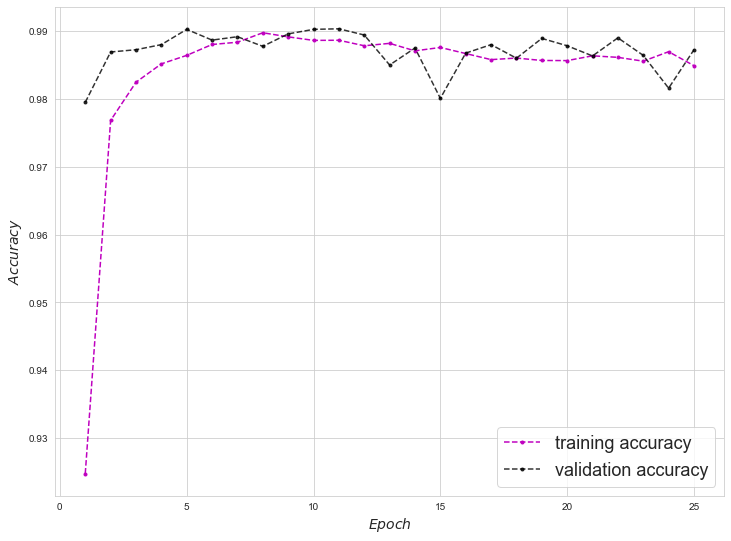

313/313 [==============================] - 1s 3ms/step


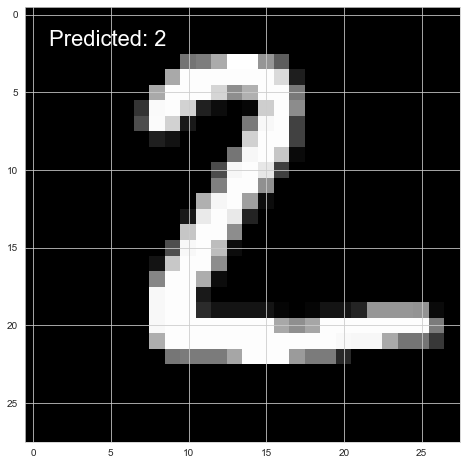

In [130]:


# Display the metrics
set_style("whitegrid")
plt.figure(figsize=(12,9))
plt.plot(range(1, len(history_dict['accuracy'])+1), history_dict['accuracy'],'m--o', markersize=3,label='training accuracy')
#plt.plot(range(1,101), history_dict['loss'],'g--o', markersize=5,label='training loss')
plt.plot(range(1, len(history_dict['accuracy'])+1), history_dict['val_accuracy'],'k--o', markersize=3, alpha=0.8, label='validation accuracy')
plt.xlabel('$Epoch$', fontsize=14)
plt.ylabel('$Accuracy$', fontsize=14)
plt.legend(fontsize=18)
plt.show()
plt.close()



# Prediction power
n=1
plt.figure(figsize=(8,8))
plt.imshow(X_test[n], cmap='gray')
predicted_digit = np.argmax(model.predict(X_test)[n])
plt.text(1,2, 'Predicted: '+ str(predicted_digit), color='white', fontsize=22 )
plt.show()
plt.close()

In [131]:
# Accuracy for test data 
score = model.evaluate(X_test, to_categorical(y_test), verbose=1)
print("%s: %.2f%%" % (model.metrics_names[1], score[1]*100))

313/313 [==============================] - 1s 3ms/step - loss: 0.0458 - accuracy: 0.9881
accuracy: 98.81%


1/1 [==============================] - 0s 13ms/step
Prediction: 7



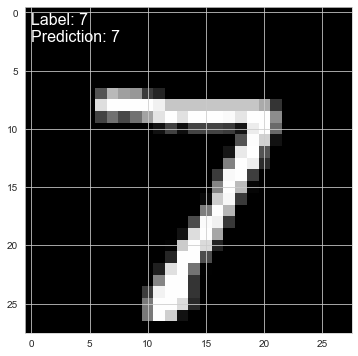

1/1 [==============================] - 0s 14ms/step
Prediction: 2



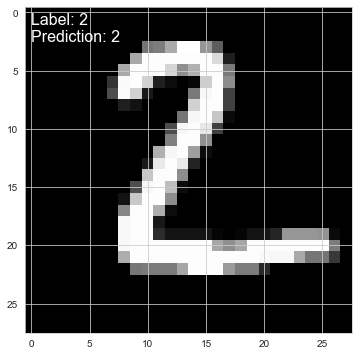

1/1 [==============================] - 0s 13ms/step
Prediction: 1



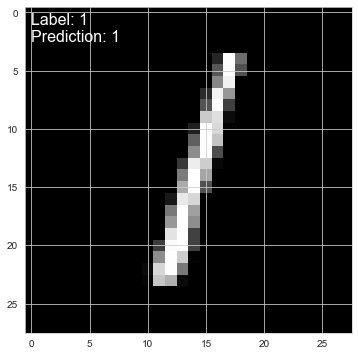

1/1 [==============================] - 0s 12ms/step
Prediction: 0



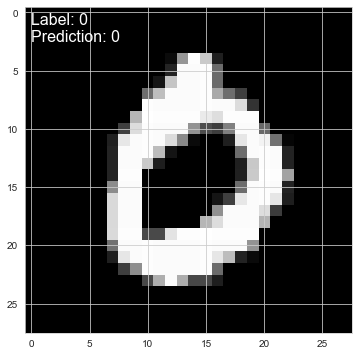

1/1 [==============================] - 0s 12ms/step
Prediction: 4



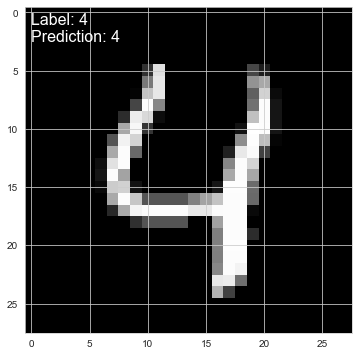

1/1 [==============================] - 0s 12ms/step
Prediction: 1



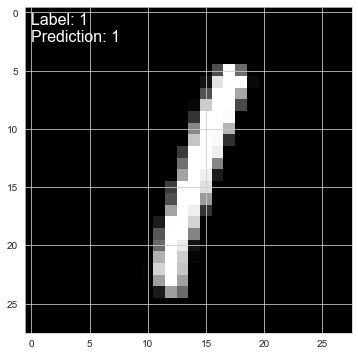

1/1 [==============================] - 0s 13ms/step
Prediction: 4



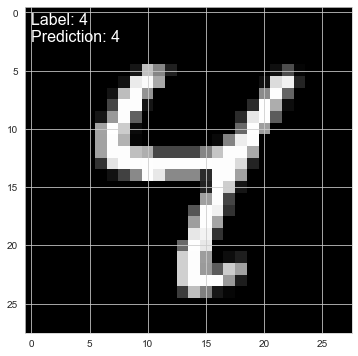

1/1 [==============================] - 0s 12ms/step
Prediction: 9



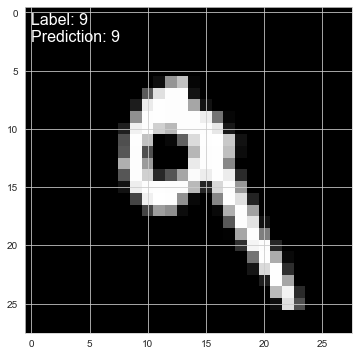

1/1 [==============================] - 0s 11ms/step
Prediction: 5



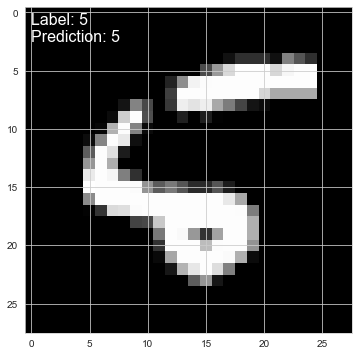

1/1 [==============================] - 0s 12ms/step
Prediction: 9



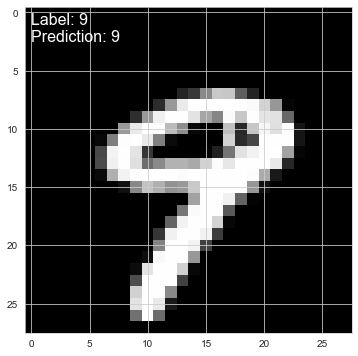

In [132]:
# Matt defined this function for checking the predictive power of the Keras model on the validation set 

def imageArray_predict(model, x, y):
    #image_array = np.array(image)[:,:].reshape(28*28)
    prediction = model.predict(np.array([x])).argmax()
    print("Prediction: {}\n".format(prediction))
    
    plt.figure(figsize=(6,6))

    plt.imshow(x.reshape(28,28), cmap="gray")
    plt.text(0,1,'Label: '+ str(y), color="white",fontsize=16)
    plt.text(0,4,"Prediction: {}\n".format(prediction), color="white",fontsize=16)
    
    plt.show()

# check for the first n images in the validation set 
# note: zip is a useful function for iterating in parallel 
n = 10
for x, y in zip(X_test[:n], y_test[:n]):
    imageArray_predict(model, x, y)

# How to load pre-saved already train model 

In [142]:
#For machine learning methods
from sklearn.model_selection import train_test_split
## Importing the things
from keras import models
from keras import layers
from keras import optimizers
from keras import losses
from keras import metrics
from keras.utils import to_categorical

# load and evaluate a saved model
from numpy import loadtxt
from keras.models import load_model
 
# load model
model = load_model('model_cnn_dig.h5')
# summarize model.
model.summary()


## This imports datasets stored in keras
from keras.datasets import mnist
(X_train, y_train),(X_test, y_test) = mnist.load_data()
### Scaling the input data
## We'll now scale X_train and X_test to be between 0 and 1
## instead of 0 and 255
X_train = X_train/255
X_test = X_test/255

#X_train = X_train.reshape(-1,28*28)
#X_test = X_test.reshape(-1,28*28)

print("The new shape of X_train is", np.shape(X_train))
print("The new shape of X_test is", np.shape(X_test))
X_train_train, X_train_val, y_train_train, y_train_val = train_test_split(X_train, y_train, shuffle=True, 
                                                                          test_size=0.2, stratify=y_train, random_state=440)

# evaluate the model
score = model.evaluate(X_test, to_categorical(y_test), verbose=0)
print("%s: %.2f%%" % (model.metrics_names[1], score[1]*100))

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 13, 13, 32)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 11, 11, 64)        18496     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 5, 5, 64)         0         
 2D)                                                             
                                                                 
 conv2d_11 (Conv2D)          (None, 3, 3, 64)          36928     
                                                                 
 flatten_1 (Flatten)         (None, 576)              

# some useful methods of keras to see the optimized 93,332 weights and biases

model.layers

model.get_weights()

In [175]:
model_bird = load_model('./archive/EfficientNetB4-BIRDS-0.99.h5')
# summarize model.
model_bird.summary()

Model: "functional_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 112, 112, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 112, 112, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 112, 112, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 stem_conv_pad (ZeroPadding2D)  (None, 113, 113, 3)  0           ['normalization[0][0]'

 block2a_dwconv_pad (ZeroPaddin  (None, 57, 57, 144)  0          ['block2a_expand_activation[0][0]
 g2D)                                                            ']                               
                                                                                                  
 block2a_dwconv (DepthwiseConv2  (None, 28, 28, 144)  1296       ['block2a_dwconv_pad[0][0]']     
 D)                                                                                               
                                                                                                  
 block2a_bn (BatchNormalization  (None, 28, 28, 144)  576        ['block2a_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block2a_activation (Activation  (None, 28, 28, 144)  0          ['block2a_bn[0][0]']             
 )        

 )                                                                                                
                                                                                                  
 block2c_se_squeeze (GlobalAver  (None, 192)         0           ['block2c_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block2c_se_reshape (Reshape)   (None, 1, 1, 192)    0           ['block2c_se_squeeze[0][0]']     
                                                                                                  
 block2c_se_reduce (Conv2D)     (None, 1, 1, 8)      1544        ['block2c_se_reshape[0][0]']     
                                                                                                  
 block2c_se_expand (Conv2D)     (None, 1, 1, 192)    1728        ['block2c_se_reduce[0][0]']      
          

 block3a_se_squeeze (GlobalAver  (None, 192)         0           ['block3a_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block3a_se_reshape (Reshape)   (None, 1, 1, 192)    0           ['block3a_se_squeeze[0][0]']     
                                                                                                  
 block3a_se_reduce (Conv2D)     (None, 1, 1, 8)      1544        ['block3a_se_reshape[0][0]']     
                                                                                                  
 block3a_se_expand (Conv2D)     (None, 1, 1, 192)    1728        ['block3a_se_reduce[0][0]']      
                                                                                                  
 block3a_se_excite (Multiply)   (None, 14, 14, 192)  0           ['block3a_activation[0][0]',     
          

                                                                  'block3c_se_expand[0][0]']      
                                                                                                  
 block3c_project_conv (Conv2D)  (None, 14, 14, 56)   18816       ['block3c_se_excite[0][0]']      
                                                                                                  
 block3c_project_bn (BatchNorma  (None, 14, 14, 56)  224         ['block3c_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block3c_drop (Dropout)         (None, 14, 14, 56)   0           ['block3c_project_bn[0][0]']     
                                                                                                  
 block3c_add (Add)              (None, 14, 14, 56)   0           ['block3c_drop[0][0]',           
          

 block4a_project_conv (Conv2D)  (None, 7, 7, 112)    37632       ['block4a_se_excite[0][0]']      
                                                                                                  
 block4a_project_bn (BatchNorma  (None, 7, 7, 112)   448         ['block4a_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block4b_expand_conv (Conv2D)   (None, 7, 7, 672)    75264       ['block4a_project_bn[0][0]']     
                                                                                                  
 block4b_expand_bn (BatchNormal  (None, 7, 7, 672)   2688        ['block4b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block4b_e

 block4d_expand_conv (Conv2D)   (None, 7, 7, 672)    75264       ['block4c_add[0][0]']            
                                                                                                  
 block4d_expand_bn (BatchNormal  (None, 7, 7, 672)   2688        ['block4d_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block4d_expand_activation (Act  (None, 7, 7, 672)   0           ['block4d_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block4d_dwconv (DepthwiseConv2  (None, 7, 7, 672)   6048        ['block4d_expand_activation[0][0]
 D)                                                              ']                               
          

 block4f_expand_activation (Act  (None, 7, 7, 672)   0           ['block4f_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block4f_dwconv (DepthwiseConv2  (None, 7, 7, 672)   6048        ['block4f_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block4f_bn (BatchNormalization  (None, 7, 7, 672)   2688        ['block4f_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block4f_activation (Activation  (None, 7, 7, 672)   0           ['block4f_bn[0][0]']             
 )        

 )                                                                                                
                                                                                                  
 block5b_se_squeeze (GlobalAver  (None, 960)         0           ['block5b_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5b_se_reshape (Reshape)   (None, 1, 1, 960)    0           ['block5b_se_squeeze[0][0]']     
                                                                                                  
 block5b_se_reduce (Conv2D)     (None, 1, 1, 40)     38440       ['block5b_se_reshape[0][0]']     
                                                                                                  
 block5b_se_expand (Conv2D)     (None, 1, 1, 960)    39360       ['block5b_se_reduce[0][0]']      
          

 block5d_se_reshape (Reshape)   (None, 1, 1, 960)    0           ['block5d_se_squeeze[0][0]']     
                                                                                                  
 block5d_se_reduce (Conv2D)     (None, 1, 1, 40)     38440       ['block5d_se_reshape[0][0]']     
                                                                                                  
 block5d_se_expand (Conv2D)     (None, 1, 1, 960)    39360       ['block5d_se_reduce[0][0]']      
                                                                                                  
 block5d_se_excite (Multiply)   (None, 7, 7, 960)    0           ['block5d_activation[0][0]',     
                                                                  'block5d_se_expand[0][0]']      
                                                                                                  
 block5d_project_conv (Conv2D)  (None, 7, 7, 160)    153600      ['block5d_se_excite[0][0]']      
          

                                                                                                  
 block5f_se_excite (Multiply)   (None, 7, 7, 960)    0           ['block5f_activation[0][0]',     
                                                                  'block5f_se_expand[0][0]']      
                                                                                                  
 block5f_project_conv (Conv2D)  (None, 7, 7, 160)    153600      ['block5f_se_excite[0][0]']      
                                                                                                  
 block5f_project_bn (BatchNorma  (None, 7, 7, 160)   640         ['block5f_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block5f_drop (Dropout)         (None, 7, 7, 160)    0           ['block5f_project_bn[0][0]']     
          

 lization)                                                                                        
                                                                                                  
 block6b_drop (Dropout)         (None, 4, 4, 272)    0           ['block6b_project_bn[0][0]']     
                                                                                                  
 block6b_add (Add)              (None, 4, 4, 272)    0           ['block6b_drop[0][0]',           
                                                                  'block6a_project_bn[0][0]']     
                                                                                                  
 block6c_expand_conv (Conv2D)   (None, 4, 4, 1632)   443904      ['block6b_add[0][0]']            
                                                                                                  
 block6c_expand_bn (BatchNormal  (None, 4, 4, 1632)  6528        ['block6c_expand_conv[0][0]']    
 ization) 

                                                                  'block6c_add[0][0]']            
                                                                                                  
 block6e_expand_conv (Conv2D)   (None, 4, 4, 1632)   443904      ['block6d_add[0][0]']            
                                                                                                  
 block6e_expand_bn (BatchNormal  (None, 4, 4, 1632)  6528        ['block6e_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block6e_expand_activation (Act  (None, 4, 4, 1632)  0           ['block6e_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block6e_d

 ization)                                                                                         
                                                                                                  
 block6g_expand_activation (Act  (None, 4, 4, 1632)  0           ['block6g_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block6g_dwconv (DepthwiseConv2  (None, 4, 4, 1632)  40800       ['block6g_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block6g_bn (BatchNormalization  (None, 4, 4, 1632)  6528        ['block6g_dwconv[0][0]']         
 )                                                                                                
          

 block7a_dwconv (DepthwiseConv2  (None, 4, 4, 1632)  14688       ['block7a_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block7a_bn (BatchNormalization  (None, 4, 4, 1632)  6528        ['block7a_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block7a_activation (Activation  (None, 4, 4, 1632)  0           ['block7a_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block7a_se_squeeze (GlobalAver  (None, 1632)        0           ['block7a_activation[0][0]']     
 agePoolin

Total params: 18,804,207
Trainable params: 18,675,416
Non-trainable params: 128,791
__________________________________________________________________________________________________
